# Look for more interesting convolutions

In this notebook, one single convolutional layer is still used. However, the number of units is increased to 16. This is done to see if the model can learn to focus on something different than just edges.

In [2]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

from tensorflow import keras
from keras.models import Model
import tensorflow as tf

import src.config as config
from src.dataloader import read_train, read_val
from src.preprocessing import CustomDataGenerator
from src.results import plot_history, plot_cm, class_report, save_params
from src.analysis import get_layer_activations

OUTPUT_FOLDER = 'notebooks/experiments/improve_classifier_3conv_2_dense/output/'

LEARNING_RATE = 0.001
BATCH_SIZE = 128
EPOCHS = 50

save_params(OUTPUT_FOLDER, lr=LEARNING_RATE, bs=BATCH_SIZE, ep=EPOCHS)

In [3]:
X_train, y_train = read_train()
print(X_train.shape, y_train.shape)

X_val, y_val = read_val()
print(X_val.shape, y_val.shape)

output_shape = len(config.LABELS)

(20300, 256, 256, 3) (20300,)
(1450, 256, 256, 3) (1450,)


In [5]:
layers = [
    keras.Input(shape=(config.IMG_SIZE, config.IMG_SIZE, config.N_CHANNELS)),
    keras.layers.Rescaling(1./255.),
    keras.layers.Conv2D(16,(3,3), activation = 'relu'),
    keras.layers.MaxPooling2D(pool_size = (4, 4)),
    keras.layers.Conv2D(32,(3,3), activation = 'relu'),
    keras.layers.MaxPooling2D(pool_size = (4, 4)),
    keras.layers.Conv2D(64,(3,3), activation = 'relu'),
    keras.layers.MaxPooling2D(pool_size = (4, 4)),

    keras.layers.Flatten(),
    keras.layers.Dense(64, activation='relu'),
    keras.layers.Dense(32, activation='relu'),
    keras.layers.Dense(output_shape, activation='softmax')
]

model = keras.Sequential(layers)
'''
sparse_categorical_crossentropy para cuando las categorias vienen en una unica columna
categorical_crossentropy para cuando las categorias vienen en formato dummy
'''
model.compile(optimizer=keras.optimizers.legacy.Adam(learning_rate=LEARNING_RATE),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_1 (Rescaling)     (None, 256, 256, 3)       0         
                                                                 
 conv2d_3 (Conv2D)           (None, 254, 254, 16)      448       
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 63, 63, 16)        0         
 g2D)                                                            
                                                                 
 conv2d_4 (Conv2D)           (None, 61, 61, 32)        4640      
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 15, 15, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_5 (Conv2D)           (None, 13, 13, 64)       

In [6]:
np.random.seed(0)
callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=4)

train_generator = CustomDataGenerator(X_train, y_train, batch_size=BATCH_SIZE)
model.fit(train_generator, epochs=EPOCHS, validation_data=(X_val, y_val), 
            callbacks=[callback])
model.save(OUTPUT_FOLDER+f'model.h5')

Epoch 1/50
159/159 [==============================] - 24s 152ms/step - loss: 3.0359 - accuracy: 0.1417 - val_loss: 2.5362 - val_accuracy: 0.2745
Epoch 2/50
159/159 [==============================] - 24s 151ms/step - loss: 2.2743 - accuracy: 0.3254 - val_loss: 2.0362 - val_accuracy: 0.3745
Epoch 3/50
159/159 [==============================] - 24s 152ms/step - loss: 1.9391 - accuracy: 0.4072 - val_loss: 1.7944 - val_accuracy: 0.4214
Epoch 4/50
159/159 [==============================] - 24s 152ms/step - loss: 1.7435 - accuracy: 0.4632 - val_loss: 1.6433 - val_accuracy: 0.4703
Epoch 5/50
159/159 [==============================] - 24s 152ms/step - loss: 1.6014 - accuracy: 0.5033 - val_loss: 1.5772 - val_accuracy: 0.5041
Epoch 6/50
159/159 [==============================] - 25s 155ms/step - loss: 1.5170 - accuracy: 0.5267 - val_loss: 1.5343 - val_accuracy: 0.5028
Epoch 7/50
159/159 [==============================] - 25s 154ms/step - loss: 1.4499 - accuracy: 0.5484 - val_loss: 1.4593 - val_ac

KeyboardInterrupt: 

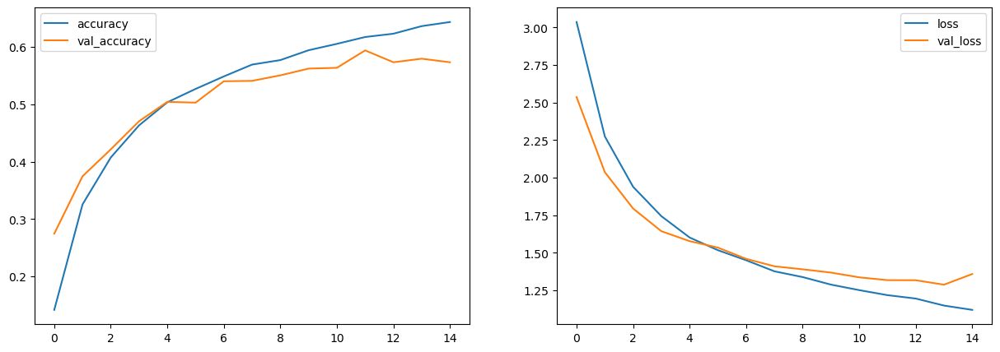

In [7]:
fig = plot_history(model)
fig.savefig(OUTPUT_FOLDER+f'history_lr_{LEARNING_RATE}_bs_{BATCH_SIZE}_ep_{EPOCHS}.png')

In [5]:
# model.save(OUTPUT_FOLDER+'model.h5')
model = keras.models.load_model(OUTPUT_FOLDER+'model.h5')

y_prob = model.predict(X_val, verbose=0)
y_pred = np.argmax(y_prob, axis=1)

fig = plot_cm(y_val, y_pred, labels=config.LABELS)
fig.savefig(OUTPUT_FOLDER+'confusion_matrix.jpg')

fig = plot_cm(y_val, y_pred, labels=config.LABELS, pct=True)
fig.savefig(OUTPUT_FOLDER+'confusion_matrix_pct.jpg')

report = class_report(y_val, y_pred, out_path=OUTPUT_FOLDER)

2023-10-30 17:21:21.280659: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-10-30 17:21:21.296879: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-10-30 17:21:21.296999: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

ResourceExhaustedError: Graph execution error:

Detected at node 'sequential/conv2d/Relu' defined at (most recent call last):
    File "<frozen runpy>", line 198, in _run_module_as_main
    File "<frozen runpy>", line 88, in _run_code
    File "/home/alberto/anaconda3/envs/tensorflow/lib/python3.11/site-packages/ipykernel_launcher.py", line 17, in <module>
      app.launch_new_instance()
    File "/home/alberto/anaconda3/envs/tensorflow/lib/python3.11/site-packages/traitlets/config/application.py", line 1046, in launch_instance
      app.start()
    File "/home/alberto/anaconda3/envs/tensorflow/lib/python3.11/site-packages/ipykernel/kernelapp.py", line 736, in start
      self.io_loop.start()
    File "/home/alberto/anaconda3/envs/tensorflow/lib/python3.11/site-packages/tornado/platform/asyncio.py", line 195, in start
      self.asyncio_loop.run_forever()
    File "/home/alberto/anaconda3/envs/tensorflow/lib/python3.11/asyncio/base_events.py", line 607, in run_forever
      self._run_once()
    File "/home/alberto/anaconda3/envs/tensorflow/lib/python3.11/asyncio/base_events.py", line 1922, in _run_once
      handle._run()
    File "/home/alberto/anaconda3/envs/tensorflow/lib/python3.11/asyncio/events.py", line 80, in _run
      self._context.run(self._callback, *self._args)
    File "/home/alberto/anaconda3/envs/tensorflow/lib/python3.11/site-packages/ipykernel/kernelbase.py", line 516, in dispatch_queue
      await self.process_one()
    File "/home/alberto/anaconda3/envs/tensorflow/lib/python3.11/site-packages/ipykernel/kernelbase.py", line 505, in process_one
      await dispatch(*args)
    File "/home/alberto/anaconda3/envs/tensorflow/lib/python3.11/site-packages/ipykernel/kernelbase.py", line 412, in dispatch_shell
      await result
    File "/home/alberto/anaconda3/envs/tensorflow/lib/python3.11/site-packages/ipykernel/kernelbase.py", line 740, in execute_request
      reply_content = await reply_content
    File "/home/alberto/anaconda3/envs/tensorflow/lib/python3.11/site-packages/ipykernel/ipkernel.py", line 422, in do_execute
      res = shell.run_cell(
    File "/home/alberto/anaconda3/envs/tensorflow/lib/python3.11/site-packages/ipykernel/zmqshell.py", line 546, in run_cell
      return super().run_cell(*args, **kwargs)
    File "/home/alberto/anaconda3/envs/tensorflow/lib/python3.11/site-packages/IPython/core/interactiveshell.py", line 3024, in run_cell
      result = self._run_cell(
    File "/home/alberto/anaconda3/envs/tensorflow/lib/python3.11/site-packages/IPython/core/interactiveshell.py", line 3079, in _run_cell
      result = runner(coro)
    File "/home/alberto/anaconda3/envs/tensorflow/lib/python3.11/site-packages/IPython/core/async_helpers.py", line 129, in _pseudo_sync_runner
      coro.send(None)
    File "/home/alberto/anaconda3/envs/tensorflow/lib/python3.11/site-packages/IPython/core/interactiveshell.py", line 3284, in run_cell_async
      has_raised = await self.run_ast_nodes(code_ast.body, cell_name,
    File "/home/alberto/anaconda3/envs/tensorflow/lib/python3.11/site-packages/IPython/core/interactiveshell.py", line 3466, in run_ast_nodes
      if await self.run_code(code, result, async_=asy):
    File "/home/alberto/anaconda3/envs/tensorflow/lib/python3.11/site-packages/IPython/core/interactiveshell.py", line 3526, in run_code
      exec(code_obj, self.user_global_ns, self.user_ns)
    File "/tmp/ipykernel_12388/71455746.py", line 4, in <module>
      y_prob = model.predict(X_val, verbose=0)
    File "/home/alberto/anaconda3/envs/tensorflow/lib/python3.11/site-packages/keras/src/utils/traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "/home/alberto/anaconda3/envs/tensorflow/lib/python3.11/site-packages/keras/src/engine/training.py", line 2554, in predict
      tmp_batch_outputs = self.predict_function(iterator)
    File "/home/alberto/anaconda3/envs/tensorflow/lib/python3.11/site-packages/keras/src/engine/training.py", line 2341, in predict_function
      return step_function(self, iterator)
    File "/home/alberto/anaconda3/envs/tensorflow/lib/python3.11/site-packages/keras/src/engine/training.py", line 2327, in step_function
      outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "/home/alberto/anaconda3/envs/tensorflow/lib/python3.11/site-packages/keras/src/engine/training.py", line 2315, in run_step
      outputs = model.predict_step(data)
    File "/home/alberto/anaconda3/envs/tensorflow/lib/python3.11/site-packages/keras/src/engine/training.py", line 2283, in predict_step
      return self(x, training=False)
    File "/home/alberto/anaconda3/envs/tensorflow/lib/python3.11/site-packages/keras/src/utils/traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "/home/alberto/anaconda3/envs/tensorflow/lib/python3.11/site-packages/keras/src/engine/training.py", line 569, in __call__
      return super().__call__(*args, **kwargs)
    File "/home/alberto/anaconda3/envs/tensorflow/lib/python3.11/site-packages/keras/src/utils/traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "/home/alberto/anaconda3/envs/tensorflow/lib/python3.11/site-packages/keras/src/engine/base_layer.py", line 1150, in __call__
      outputs = call_fn(inputs, *args, **kwargs)
    File "/home/alberto/anaconda3/envs/tensorflow/lib/python3.11/site-packages/keras/src/utils/traceback_utils.py", line 96, in error_handler
      return fn(*args, **kwargs)
    File "/home/alberto/anaconda3/envs/tensorflow/lib/python3.11/site-packages/keras/src/engine/sequential.py", line 405, in call
      return super().call(inputs, training=training, mask=mask)
    File "/home/alberto/anaconda3/envs/tensorflow/lib/python3.11/site-packages/keras/src/engine/functional.py", line 512, in call
      return self._run_internal_graph(inputs, training=training, mask=mask)
    File "/home/alberto/anaconda3/envs/tensorflow/lib/python3.11/site-packages/keras/src/engine/functional.py", line 669, in _run_internal_graph
      outputs = node.layer(*args, **kwargs)
    File "/home/alberto/anaconda3/envs/tensorflow/lib/python3.11/site-packages/keras/src/utils/traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "/home/alberto/anaconda3/envs/tensorflow/lib/python3.11/site-packages/keras/src/engine/base_layer.py", line 1150, in __call__
      outputs = call_fn(inputs, *args, **kwargs)
    File "/home/alberto/anaconda3/envs/tensorflow/lib/python3.11/site-packages/keras/src/utils/traceback_utils.py", line 96, in error_handler
      return fn(*args, **kwargs)
    File "/home/alberto/anaconda3/envs/tensorflow/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py", line 321, in call
      return self.activation(outputs)
    File "/home/alberto/anaconda3/envs/tensorflow/lib/python3.11/site-packages/keras/src/activations.py", line 321, in relu
      return backend.relu(
    File "/home/alberto/anaconda3/envs/tensorflow/lib/python3.11/site-packages/keras/src/backend.py", line 5397, in relu
      x = tf.nn.relu(x)
Node: 'sequential/conv2d/Relu'
OOM when allocating tensor with shape[32,64,254,254] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc
	 [[{{node sequential/conv2d/Relu}}]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info. This isn't available when running in Eager mode.
 [Op:__inference_predict_function_494]

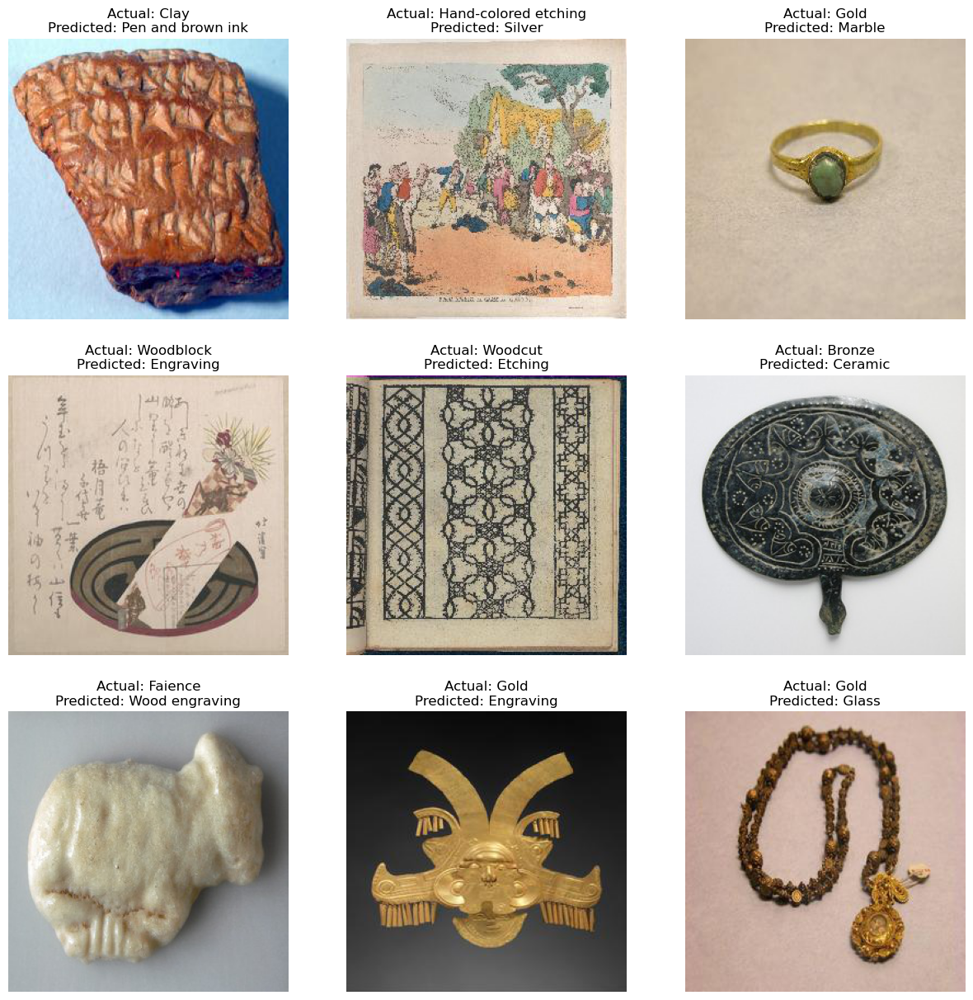

In [9]:
# Get the indices of wrong predictions
wrong_idx = np.where(y_val != y_pred)[0]

# Plot some of the wrong predictions
fig, ax = plt.subplots(3,3, figsize=(15,15))
for i, idx in enumerate(wrong_idx[:9]):
    img = X_train[idx]
    ax[i//3, i%3].imshow(img)
    ax[i//3, i%3].set_title(f'Actual: {config.LABELS[y_train[idx]]}\nPredicted: {config.LABELS[y_pred[idx]]}')
    ax[i//3, i%3].axis('off')
plt.show()


In [34]:
Activations[5].shape

(1, 13, 13, 64)

1/1 [==============================] - 0s 39ms/step


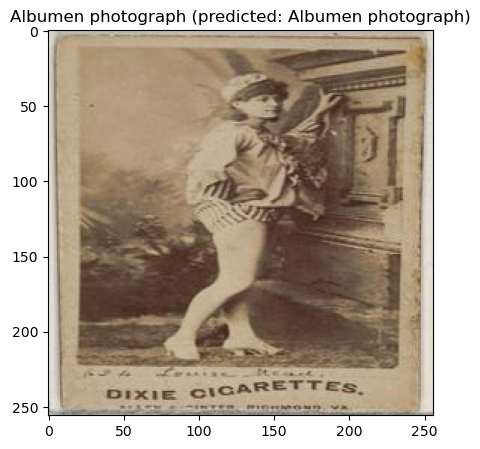

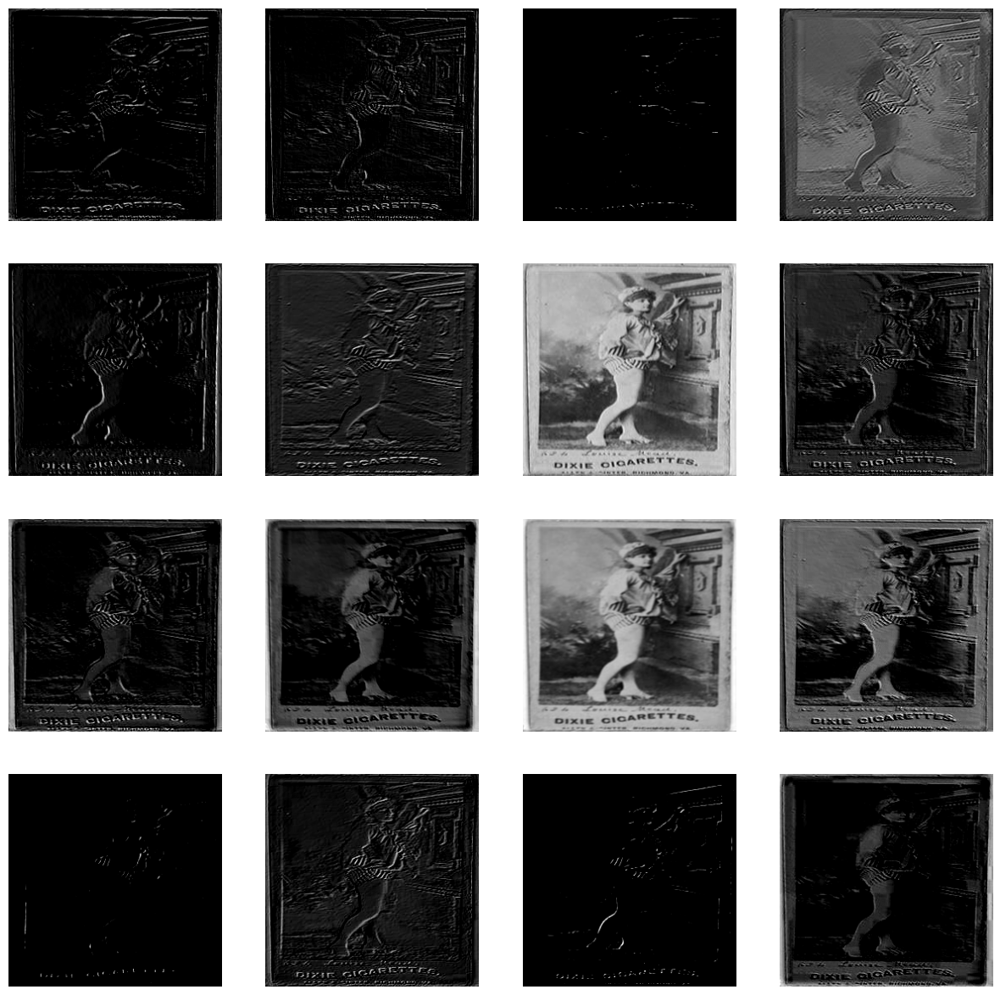

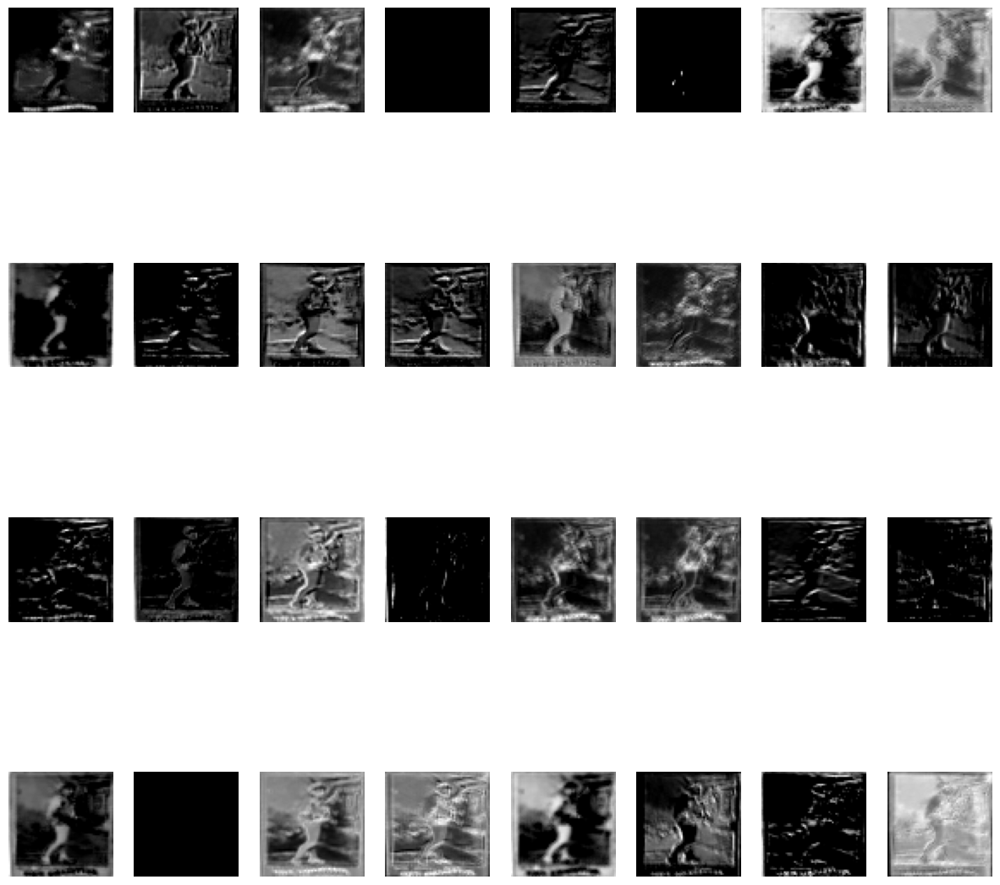

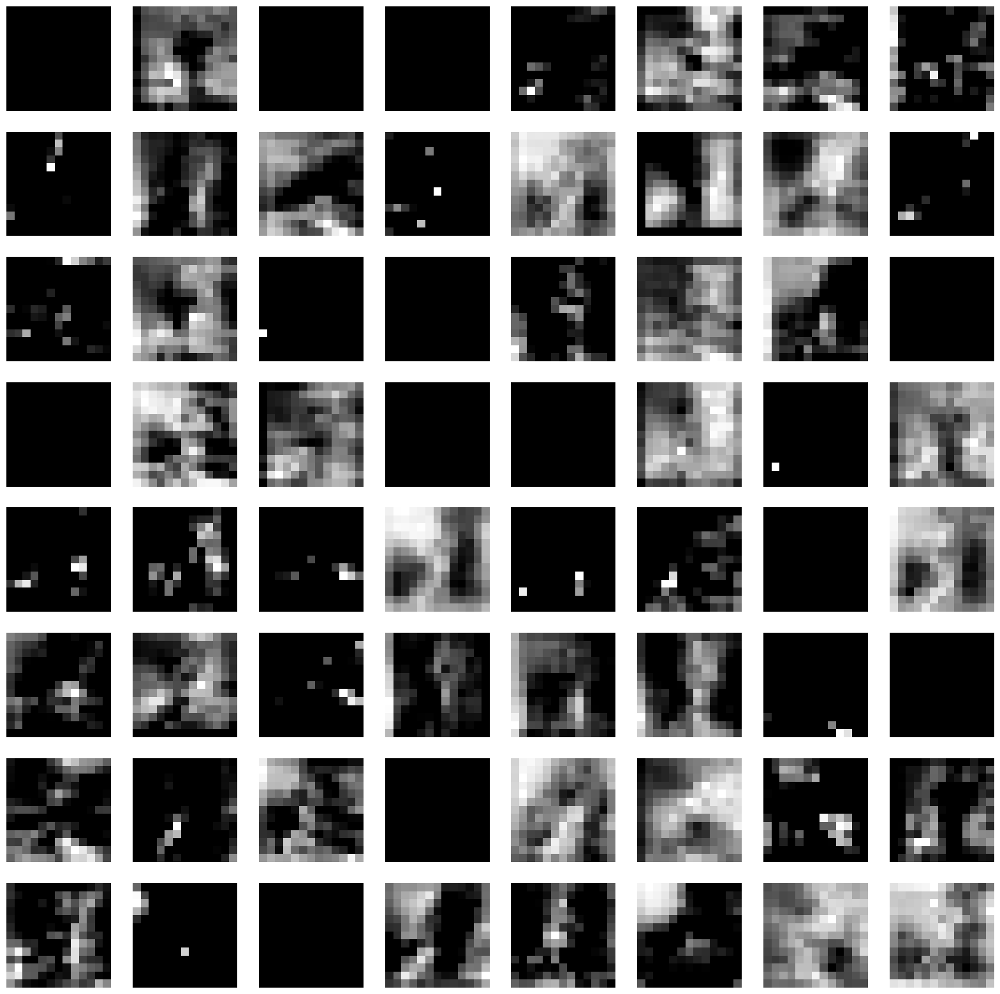

In [10]:
# Import model from kerasa
from keras.models import Model

k = 25
fig, ax = plt.subplots(1,1, figsize=(5,5))
ax.imshow(X_val[k, :, :])
ax.set_title(f"{config.LABELS[y_val[k]]} (predicted: {config.LABELS[y_pred[k]]})")

Image_Tensor = X_val[k, :, :].astype(float)
Image_Tensor = tf.expand_dims(Image_Tensor, axis = 0)
# Image_Tensor = Image_Tensor/255.0

# Extract the Model Outputs for all the Layers
Model_Outputs = [layer.output for layer in model.layers]
# Create a Model with Model Input as Input and the Model Outputs as Output
Activation_Model = Model(model.input, Model_Outputs)
Activations = Activation_Model.predict(Image_Tensor)

fig, ax = plt.subplots(4, 4, figsize=(15, 15))
for i in range(4):
    for j in range(4):
        ax[i, j].imshow(Activations[1][0, :, :, i*4 + j], cmap='gray')
        ax[i, j].axis('off')
plt.show()

fig, ax = plt.subplots(4, 8, figsize=(15, 15))
ax = ax.ravel()

for i in range(32):
    ax[i].imshow(Activations[3][0, :, :, i], cmap='gray')
    ax[i].axis('off')

plt.show()

fig, ax = plt.subplots(8, 8, figsize=(20, 20))
ax = ax.ravel()
for i in range(64):
    ax[i].imshow(Activations[5][0, :, :, i], cmap='gray')
    ax[i].axis('off')

1/1 [==============================] - 0s 37ms/step


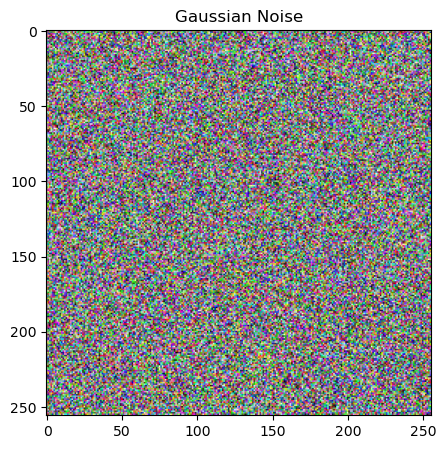

In [7]:
# Import model from kerasa
from keras.models import Model


noise = np.random.random((config.IMG_SIZE, config.IMG_SIZE, config.N_CHANNELS))
fig, ax = plt.subplots(1,1, figsize=(5,5))
ax.imshow(noise)
ax.set_title(f"Gaussian Noise")

# Generate ramdom noise image and plot it
activations = get_layer_activations(noise, model)

Image_Tensor = noise.astype(float)
Image_Tensor = tf.expand_dims(noise, axis = 0)
# Image_Tensor = Image_Tensor/255.0

# Extract the Model Outputs for all the Layers
Model_Outputs = [layer.output for layer in model.layers]
# Create a Model with Model Input as Input and the Model Outputs as Output
Activation_Model = Model(model.input, Model_Outputs)
Activations = Activation_Model.predict(Image_Tensor)

In [32]:
noise = np.random.randn(config.IMG_SIZE, config.IMG_SIZE, config.N_CHANNELS) * 26 + 122
# plt.hist(noise[:, :, 0].ravel(), bins=256, color='red', alpha=0.5)
noise.max()

233.69212231026114

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 38ms/step


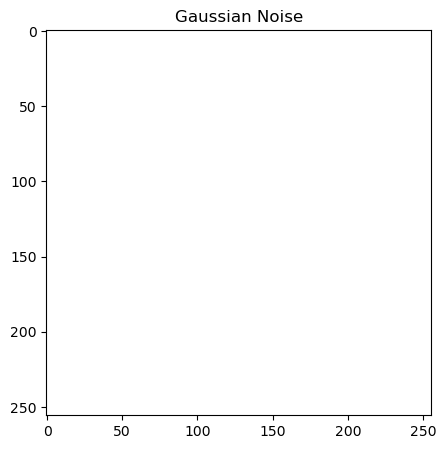

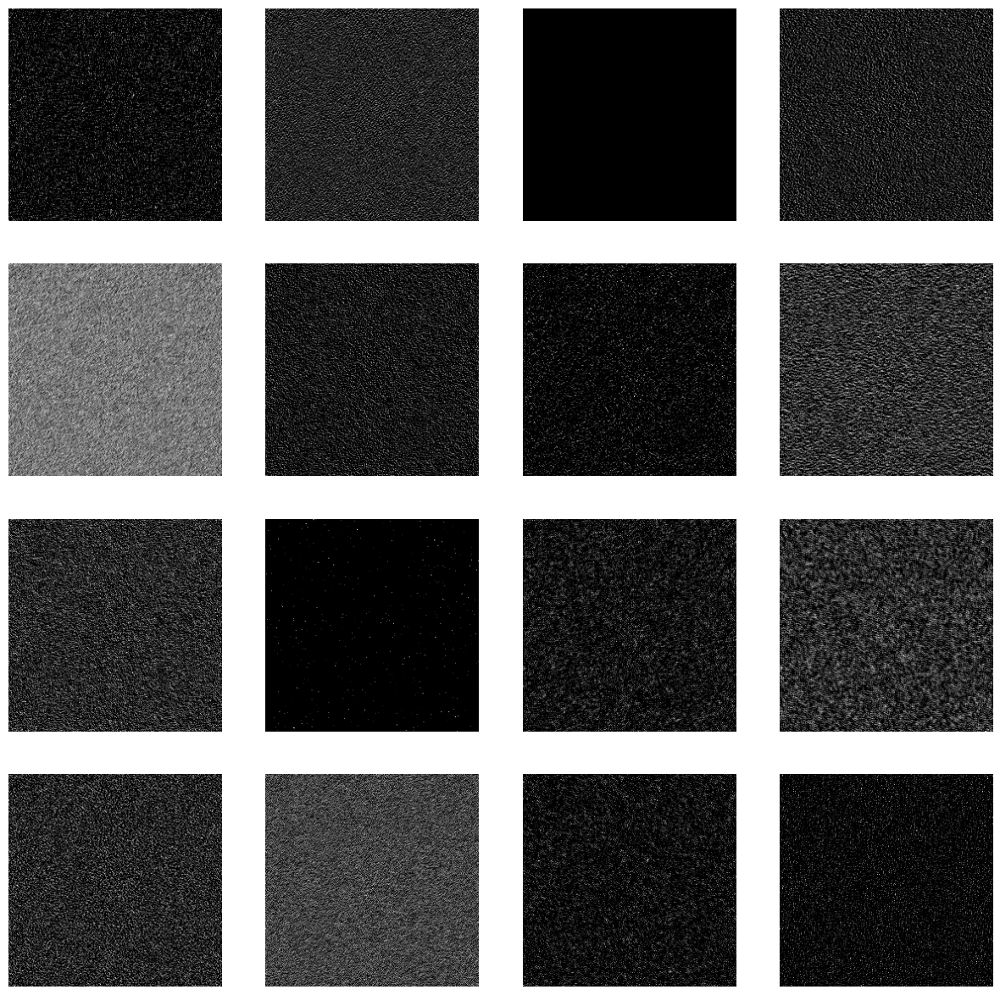

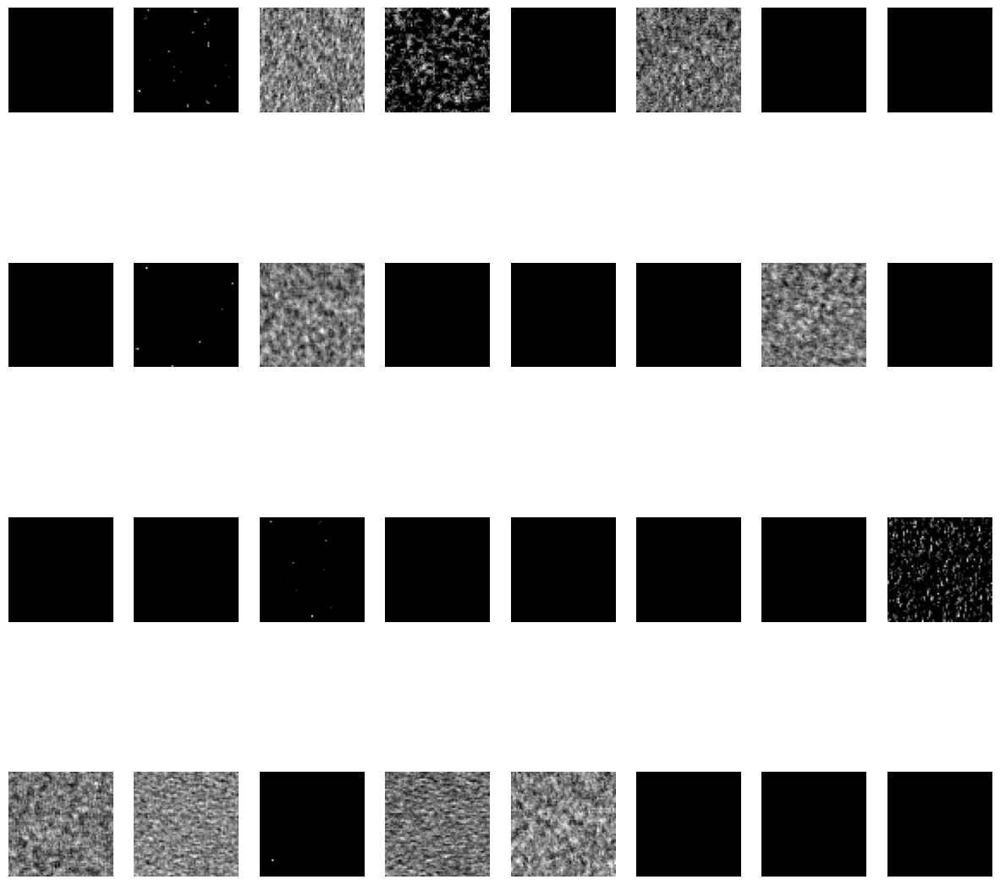

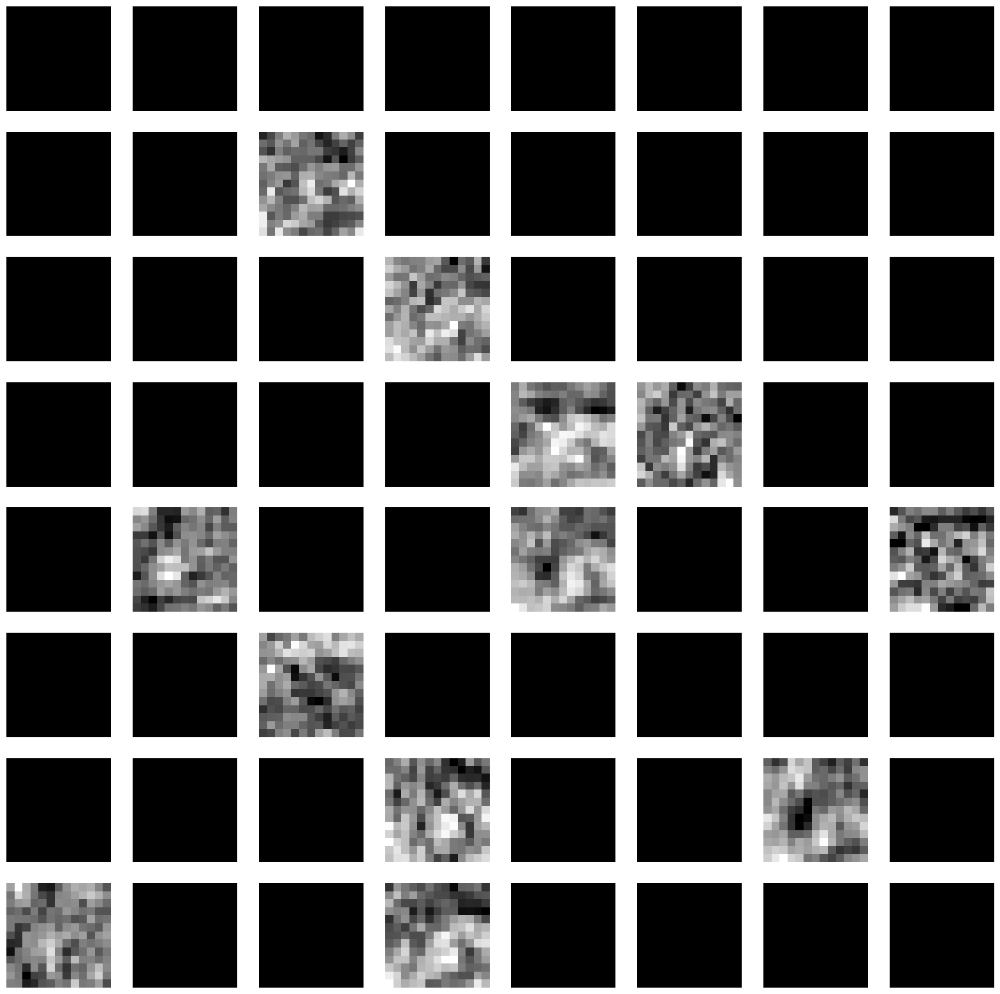

In [36]:
# Import model from kerasa
from keras.models import Model


noise = np.random.randn(config.IMG_SIZE, config.IMG_SIZE, config.N_CHANNELS) * 26 + 122
noise[noise > 255] = 255
noise[noise < 0] = 0
fig, ax = plt.subplots(1,1, figsize=(5,5))
ax.imshow(noise)
ax.set_title(f"Gaussian Noise")

# Generate ramdom noise image and plot it
activations = get_layer_activations(noise, model)

Image_Tensor = noise.astype(float)
Image_Tensor = tf.expand_dims(noise, axis = 0)

# Extract the Model Outputs for all the Layers
Model_Outputs = [layer.output for layer in model.layers]
# Create a Model with Model Input as Input and the Model Outputs as Output
Activation_Model = Model(model.input, Model_Outputs)
Activations = Activation_Model.predict(Image_Tensor)

fig, ax = plt.subplots(4, 4, figsize=(15, 15))
for i in range(4):
    for j in range(4):
        ax[i, j].imshow(Activations[1][0, :, :, i*4 + j], cmap='gray')
        ax[i, j].axis('off')
plt.show()

fig, ax = plt.subplots(4, 8, figsize=(15, 15))
ax = ax.ravel()

for i in range(32):
    ax[i].imshow(Activations[3][0, :, :, i], cmap='gray')
    ax[i].axis('off')

plt.show()

fig, ax = plt.subplots(8, 8, figsize=(20, 20))
ax = ax.ravel()
for i in range(64):
    ax[i].imshow(Activations[5][0, :, :, i], cmap='gray')
    ax[i].axis('off')

they are still quite simple features, but they are not just edges.

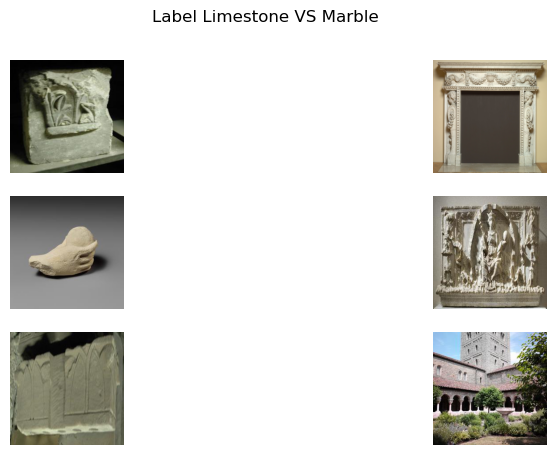

In [40]:
def plot_compare_classes(X, y, cat_name1, cat_name2, labels, n_plots=3):
    
    cat_idx1 = labels.index(cat_name1)
    cat_idx2 = labels.index(cat_name2)

    X_1, X_2 = X[y == cat_idx1], X[y == cat_idx2]
    rnd_idx = np.random.randint(0, min(X_1.shape[0], X_2.shape[0]), n_plots)
    fig, ax = plt.subplots(n_plots, 2, figsize=(10, 5))

    for i, idx in enumerate(rnd_idx):
        ax[i, 0].imshow(X_1[idx])
        ax[i, 0].axis('off')

        ax[i, 1].imshow(X_2[idx])
        ax[i, 1].axis('off')

    fig.suptitle(f"Label {cat_name1} VS {cat_name2}")
    plt.show()

plot_compare_classes(X_train, y_train, "Limestone", "Marble", labels=config.LABELS)

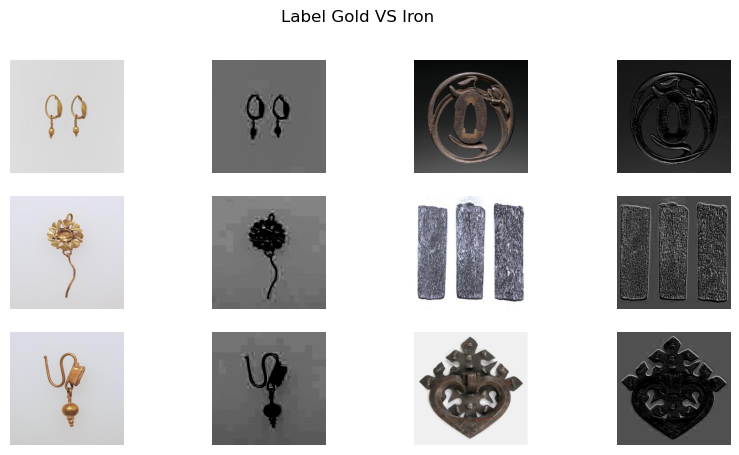

In [45]:
def get_layer_activations(Image_Tensor, model):
    Image_Tensor = tf.expand_dims(Image_Tensor, axis = 0)

    # Extract the Model Outputs for all the Layers
    Model_Outputs = [layer.output for layer in model.layers]
    # Create a Model with Model Input as Input and the Model Outputs as Output
    Activation_Model = Model(model.input, Model_Outputs)
    Activations = Activation_Model.predict(Image_Tensor, verbose=0)
    return Activations

def plot_compare_activations(X, y, cat_name1, cat_name2, labels, model, n_plots=3):
    
    cat_idx1 = labels.index(cat_name1)
    cat_idx2 = labels.index(cat_name2)

    X_1, X_2 = X[y == cat_idx1], X[y == cat_idx2]
    rnd_idx = np.random.randint(0, min(X_1.shape[0], X_2.shape[0]), n_plots)
    
    fig, ax = plt.subplots(n_plots, 4, figsize=(10, 5))
    for i, idx in enumerate(rnd_idx):
        ax[i, 0].imshow(X_1[idx])
        ax[i, 0].axis('off')

        act_1 = get_layer_activations(X_1[idx], model)[1][0, :, :, 7]
        ax[i, 1].imshow(act_1, cmap='gray')
        ax[i, 1].axis('off')

        ax[i, 2].imshow(X_2[idx])
        ax[i, 2].axis('off')

        act_2 = get_layer_activations(X_2[idx], model)[1][0, :, :, 7]
        ax[i, 3].imshow(act_2, cmap='gray')
        ax[i, 3].axis('off')

    fig.suptitle(f"Label {cat_name1} VS {cat_name2}")
    plt.show()

plot_compare_activations(X_train, y_train, "Gold", "Iron", model=model, labels=config.LABELS)

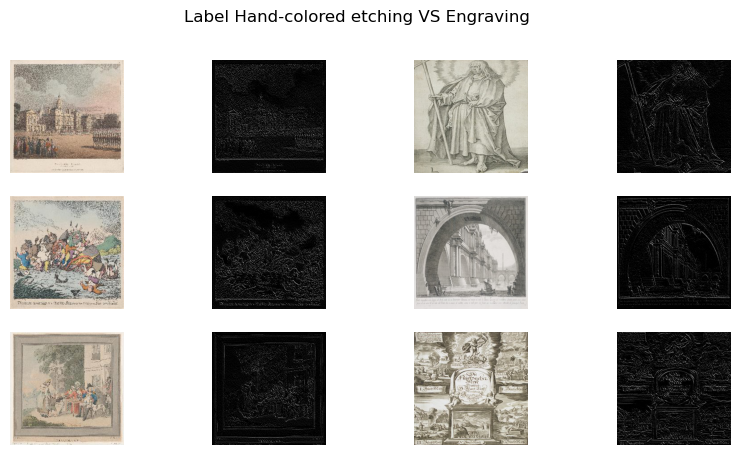

In [22]:
plot_compare_activations(X_train, y_train, "Hand-colored etching", "Engraving", model=model, labels=labels)

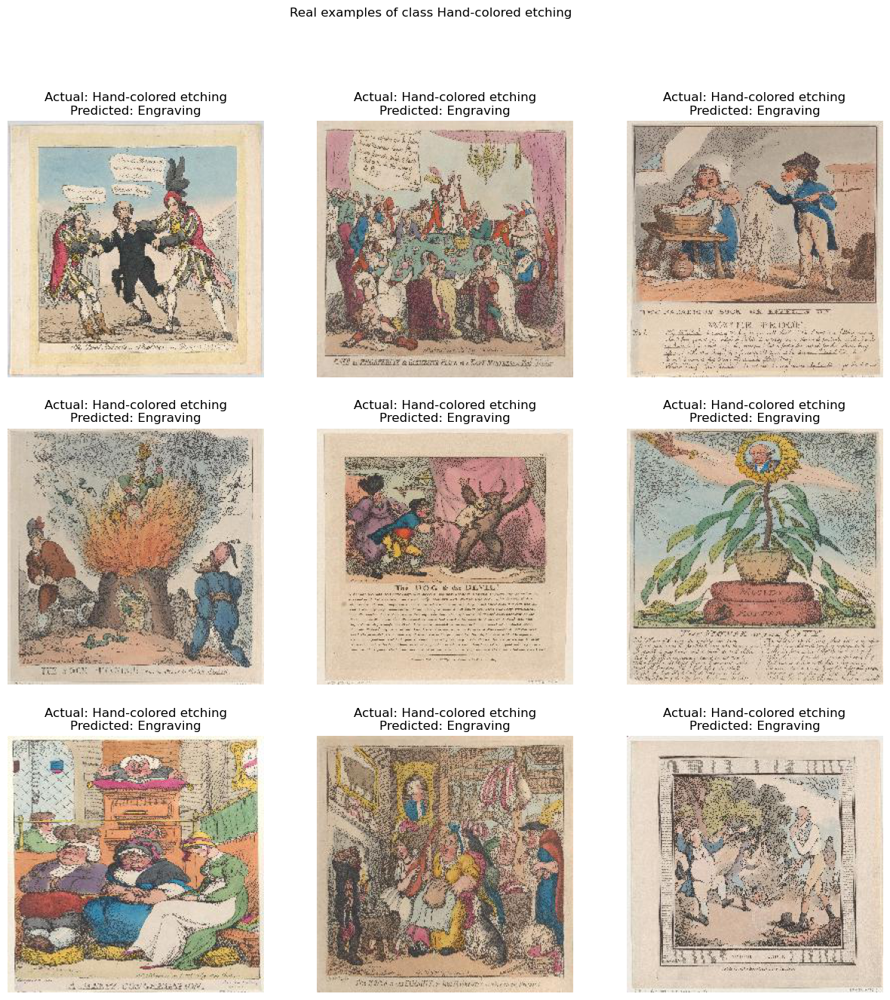

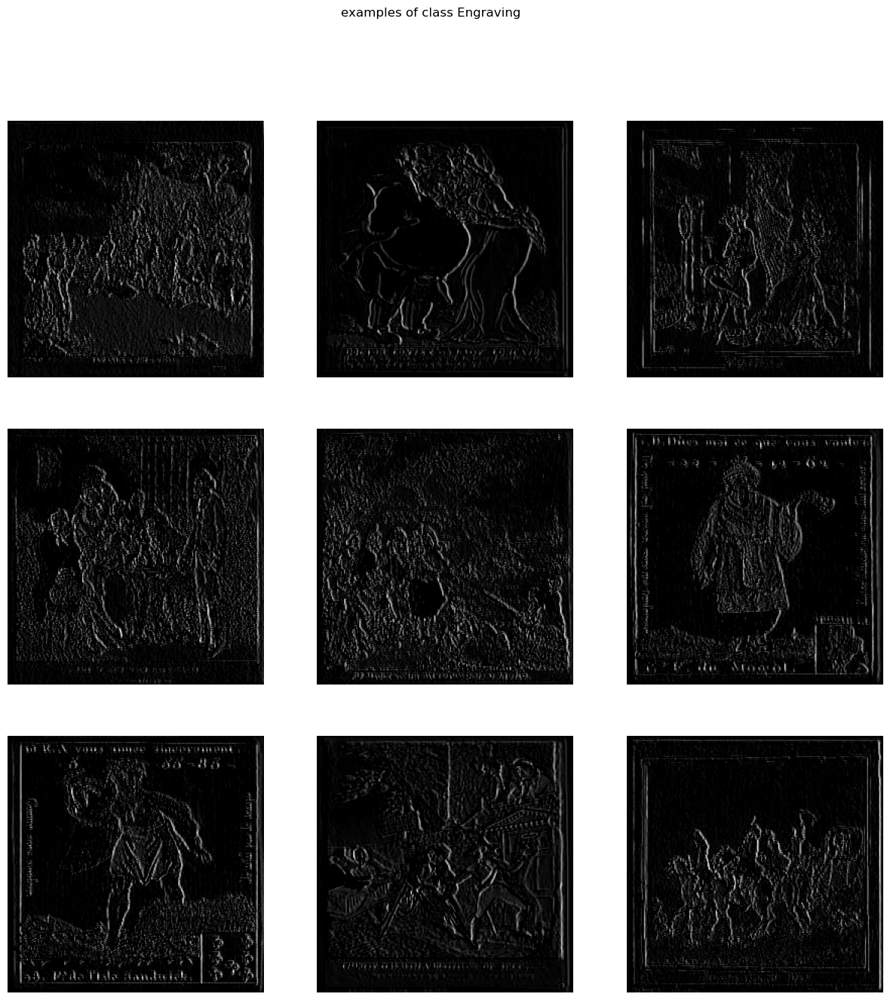

Text(0.5, 0.98, 'examples of class 4')

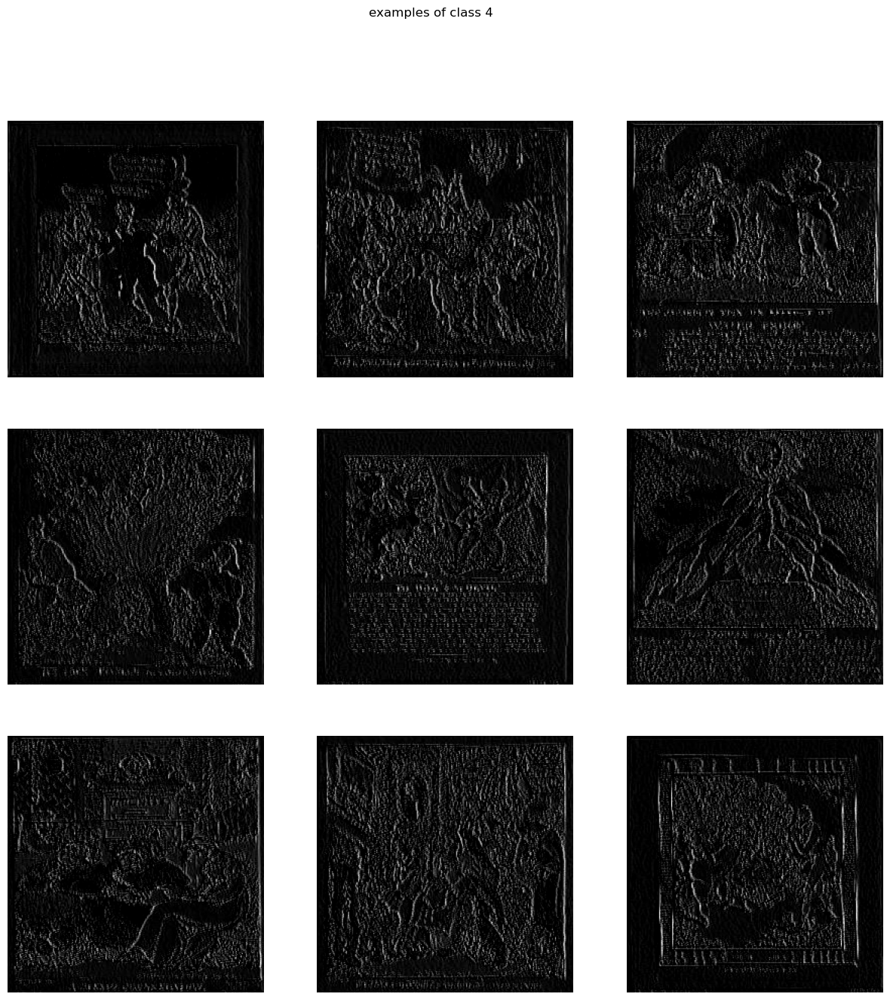

In [26]:
def get_layer_activations(Image_Tensor, model):
    Image_Tensor = tf.expand_dims(Image_Tensor, axis = 0)

    # Extract the Model Outputs for all the Layers
    Model_Outputs = [layer.output for layer in model.layers]
    # Create a Model with Model Input as Input and the Model Outputs as Output
    Activation_Model = Model(model.input, Model_Outputs)
    Activations = Activation_Model.predict(Image_Tensor, verbose=0)
    return Activations

cat_pred_name = 'Engraving'
cat_real_name = 'Hand-colored etching'

cat_pred = labels.index(cat_pred_name)
cat_real = labels.index(cat_real_name)
X_wrong = X_train[(y_train == cat_real)&(y_pred == cat_pred)]    


# Print examples of the misclassified
fig, ax = plt.subplots(3,3, figsize=(15,15))
for i, img in enumerate(X_wrong[:9]):
    ax[i//3, i%3].imshow(img)
    ax[i//3, i%3].set_title(f'Actual: {labels[cat_real]}\nPredicted: {labels[cat_pred]}')
    ax[i//3, i%3].axis('off')
fig.suptitle(f"Real examples of class {cat_real_name}")
plt.show()

# Show the activations of the real class
X_real = X_train[y_train == cat_real]

fig, ax = plt.subplots(3,3, figsize=(15,15))
for i, img in enumerate(X_real[:9]):
    act = get_layer_activations(img, model)[1][0, :, :, :];
    ax[i//3, i%3].imshow(act, cmap="gray")
    ax[i//3, i%3].axis('off')
fig.suptitle(f"examples of class {cat_pred_name}")
plt.show()

# SHow the activations of the class supposed by the model

fig, ax = plt.subplots(3,3, figsize=(15,15))
for i, img in enumerate(X_wrong[:9]):
    act = get_layer_activations(img, model)[1][0, :, :, :];
    ax[i//3, i%3].imshow(act, cmap='gray')
    ax[i//3, i%3].axis('off')

fig.suptitle(f"examples of class {cat_pred}")

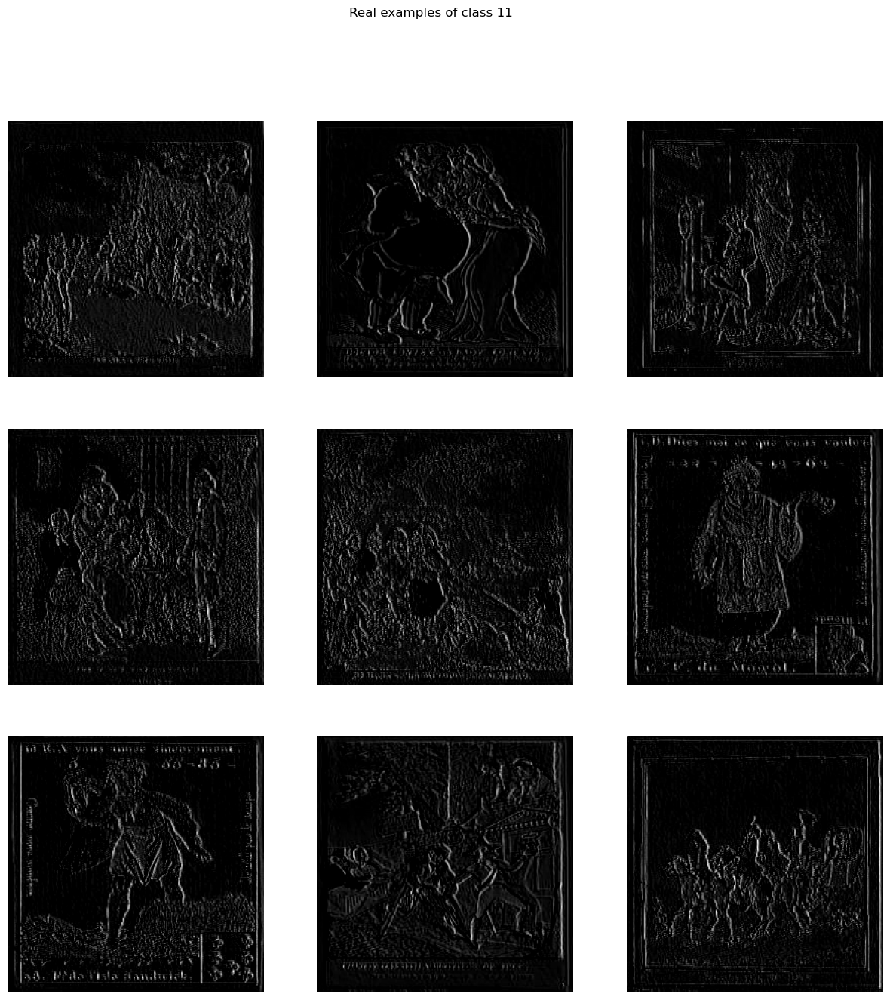

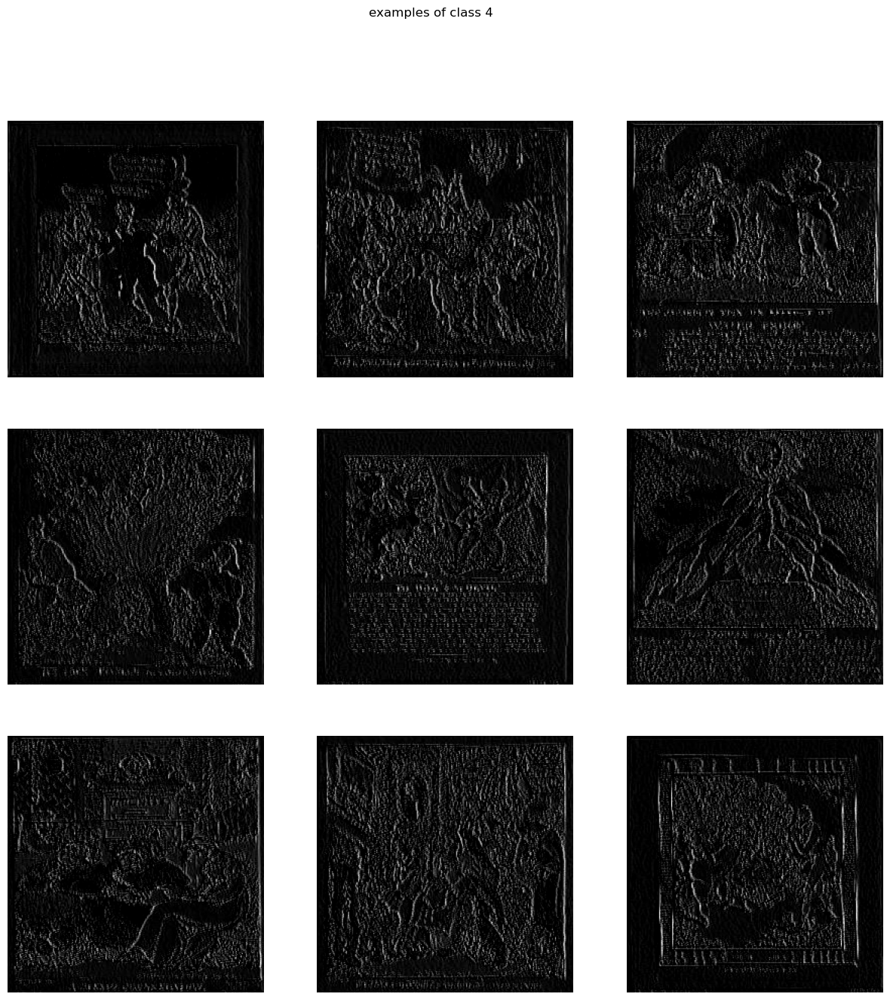

In [23]:
def get_layer_activations(Image_Tensor, model):
    Image_Tensor = tf.expand_dims(Image_Tensor, axis = 0)

    # Extract the Model Outputs for all the Layers
    Model_Outputs = [layer.output for layer in model.layers]
    # Create a Model with Model Input as Input and the Model Outputs as Output
    Activation_Model = Model(model.input, Model_Outputs)
    Activations = Activation_Model.predict(Image_Tensor, verbose=0)
    return Activations

X_ivory = X_train[y_train == cat_real]

fig, ax = plt.subplots(3,3, figsize=(15,15))
for i, img in enumerate(X_ivory[:9]):
    act = get_layer_activations(img, model)[1][0, :, :, :];
    ax[i//3, i%3].imshow(act, cmap="gray")
    ax[i//3, i%3].axis('off')
fig.suptitle(f"Real examples of class {cat_real}")
plt.show()

fig, ax = plt.subplots(3,3, figsize=(15,15))
for i, img in enumerate(X_wrong[:9]):
    act = get_layer_activations(img, model)[1][0, :, :, :];
    ax[i//3, i%3].imshow(act, cmap='gray')
    ax[i//3, i%3].axis('off')

fig.suptitle(f"examples of class {cat_pred}")
plt.show()

1/1 [==============================] - 0s 30ms/step


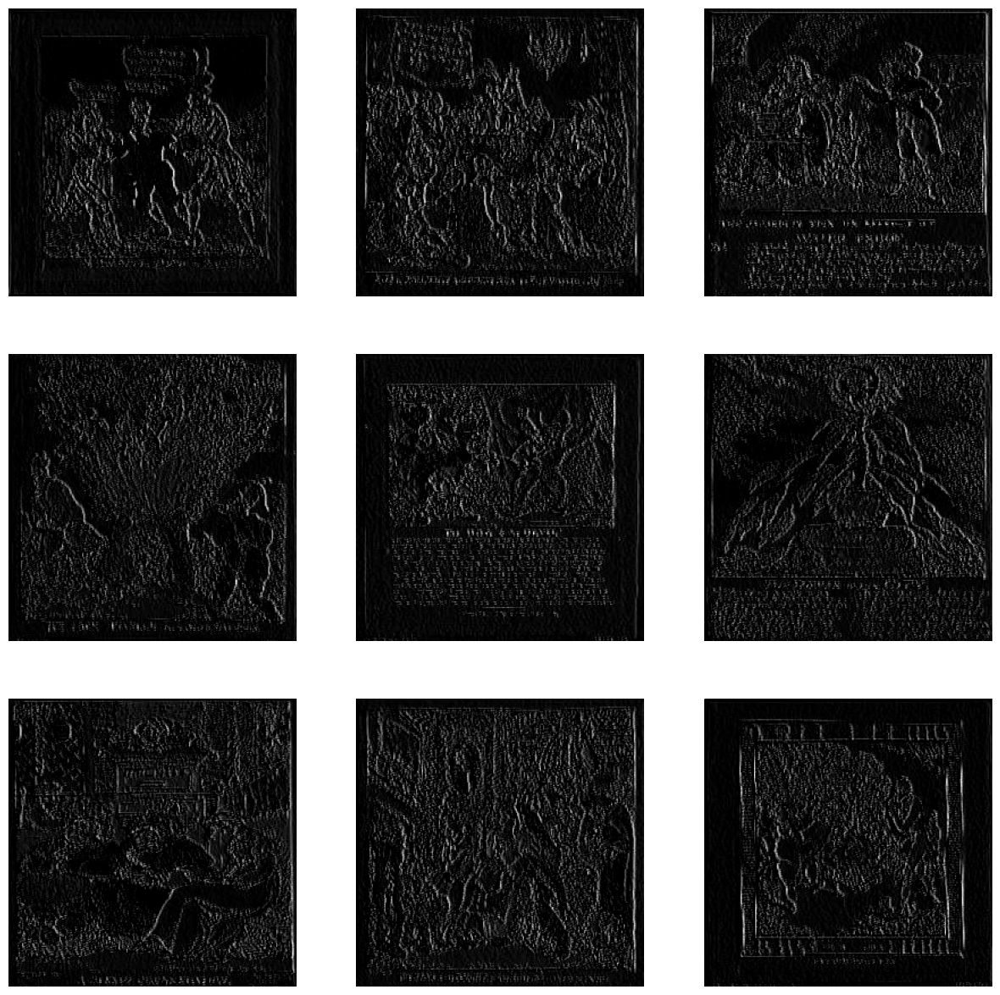

In [19]:
fig, ax = plt.subplots(3,3, figsize=(15,15))
for i, img in enumerate(X_wrong[:9]):
    act = get_layer_activations(img, model)[1][0, :, :, :];
    ax[i//3, i%3].imshow(act, cmap='gray')
    ax[i//3, i%3].axis('off')